<a href="https://colab.research.google.com/github/npuneeth/York_Univ_ML/blob/main/FIFA_2022.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **SCOUTING FOOTBALLERS** 
## *AN UNSUPERVISED LEARNING APPROACH* 
**CSML-1000 | By GROUP 3** (*Jean-Jacques Rousseau, David Geller, Kwangjin Park, Petr Kocourek and Puneeth Nagarajaiah*)

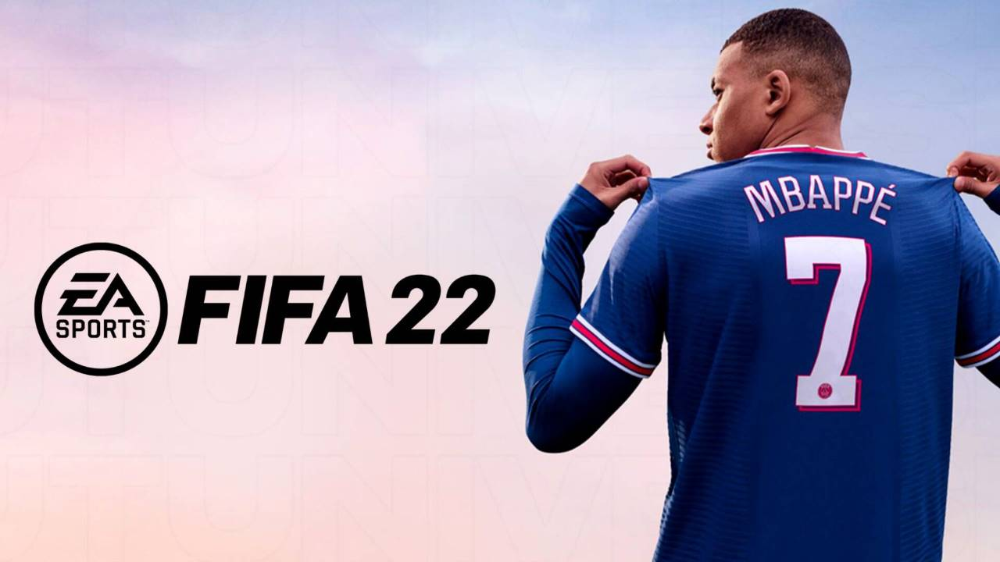

# Table of Contents

1.  Introduction
2.  Installation
3.  General Dataset Analysis
4.  GoalKeeper Dataset Analysis 
5.  Model Analysis
6.  Conclusion with Outcomes & Improvements
7. Bibliography

# 1. Introduction

How much would it cost a soccer team to sign a full roster of players? In English Premier League (EPL), Manchester United FC is the first overall in total salary expense of players, totalling at £227,081,000. On the other hand, Brentford FC ranked last in total salary expense at £15,776,000. In 2021~2022 EPL season, Manchester United ended the season in sixth place, while Brentford ended the season in 13th place. Although Mancheser United spent nearly 1339% more on player salary than Brentford FC, it is hard to justify having to spend that much money on their disappointing season. If paying more for the players doesn't guarantee a good team, then what could be the factors?

To stay competitive in the league, soccer teams must examine the players they need by scouring all over leagues. Agents from each team will look at each player's past performances, techniques, age, physical attributes, game intelligence, mindset, etc to determine if he is the player they are looking for. Scouting for players manually through analysis of individual agent has become more challenging as the number of professional players increased. 

If agents can use the help of machine learning that has been trained on a dataset of all available players, they simply need to supply attributes that they find most important to narrow down players of interest. This will greatly save scouts time and money. 
 
* **Business Problem:** Using Machine Learning (Clustering), find the player that meets the specific requirements supplied by a soccer agent. For example, if an agent comes to our web app and enters scores they want for each skill using the slider (eg. choosing a value between 0 and 100), our webapp will output a list of names of players with highest match scores. This will greatly narrow down the number of players the agent has to scout for. 

* **Dataset:** FIFA 22 complete player dataset (https://www.kaggle.com/datasets/stefanoleone992/fifa-22-complete-player-dataset/discussion/360882)

# 2. Installation
### In this section, we install pycaret and the Kaggle dataset. This section is similar to Assignment 1.   
* **Setting Up Modules:** How to install pycaret, kaggle and other required modules
* **Getting Data:**  How to import data from Kaggle website directly

In [ ]:
! pip install pycaret

In [ ]:
! pip install pandas
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns; sns.set_theme()

In [ ]:
! pip install Kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download stefanoleone992/fifa-22-complete-player-dataset
! unzip fifa-22-complete-player-dataset.zip
df = pd.read_csv('/content/players_22.csv')

# 3. General Dataset Analysis

This section explores the characteristics of the data so that we can develop and intuitive feel for the dataset. 

## 3.1 Data Exploration

In [ ]:
# Data dimension

df.shape

(19239, 110)

#### The dataset has over 19000 players with 110 attributes.

In [ ]:
# Descriptive Statistics
df.describe() 

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_level,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
count,19239.000000,19239.000000,19239.000000,1.916500e+04,19178.000000,19239.000000,19239.000000,19239.000000,19178.000000,19178.000000,...,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,19239.000000,2132.000000
mean,231468.086959,65.772182,71.079370,2.850452e+06,9017.989363,25.210822,181.299704,74.943032,50580.498123,1.354364,...,57.929830,46.601746,48.045584,45.906700,16.406102,16.192474,16.055356,16.229274,16.491814,36.439962
std,27039.717497,6.880232,6.086213,7.613700e+06,19470.176724,4.748235,6.863179,7.069434,54401.868535,0.747865,...,12.159326,20.200807,21.232718,20.755683,17.574028,16.839528,16.564554,17.059779,17.884833,10.751563
min,41.000000,47.000000,49.000000,9.000000e+03,500.000000,16.000000,155.000000,49.000000,1.000000,1.000000,...,12.000000,4.000000,5.000000,5.000000,2.000000,2.000000,2.000000,2.000000,2.000000,15.000000
25%,214413.500000,61.000000,67.000000,4.750000e+05,1000.000000,21.000000,176.000000,70.000000,479.000000,1.000000,...,50.000000,29.000000,28.000000,25.000000,8.000000,8.000000,8.000000,8.000000,8.000000,27.000000
50%,236543.000000,66.000000,71.000000,9.750000e+05,3000.000000,25.000000,181.000000,75.000000,1938.000000,1.000000,...,59.000000,52.000000,56.000000,53.000000,11.000000,11.000000,11.000000,11.000000,11.000000,36.000000
75%,253532.500000,70.000000,75.000000,2.000000e+06,8000.000000,29.000000,186.000000,80.000000,111139.000000,1.000000,...,66.000000,63.000000,65.000000,63.000000,14.000000,14.000000,14.000000,14.000000,14.000000,45.000000
max,264640.000000,93.000000,95.000000,1.940000e+08,350000.000000,54.000000,206.000000,110.000000,115820.000000,5.000000,...,96.000000,93.000000,93.000000,92.000000,91.000000,92.000000,93.000000,92.000000,90.000000,65.000000


#### Here you can see general statistic of the data, such as count, mean, min and max. For example, the mean age of the players is 25.2 years old, with the youngest play being 16 years old.

In [ ]:
pd.set_option('display.max_columns', None)
type(df)

pandas.core.frame.DataFrame

In [ ]:
df.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,1987-06-24,170,72,73.0,Paris Saint-Germain,French Ligue 1,1.0,RW,30.0,NaN,2021-08-10,2023.0,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93,93,93,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,1988-08-21,185,81,21.0,FC Bayern München,German 1. Bundesliga,1.0,ST,9.0,NaN,2014-07-01,2023.0,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,1985-02-05,187,83,11.0,Manchester United,English Premier League,1.0,ST,7.0,NaN,2021-08-27,2023.0,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png


#### Soccer player requires more than just some technical skills to be an excellent player. For example, Lionel Messi is an excellent ball handler and scorer, but he is also a leader who fosters communication and teamwork within the team, which helps other players perform better as well. 

#### We have expanded column-wise to see all columns. Here, just by taking a quick glance, most of columns are numerical in nature, where different skills are given a score between 0 and 100. 

#### For example, Christiano Ronaldo has the overall score of 91, shooting score of 94, dribbling score of 88, but defending score of 34. 

In [ ]:
# Checking for missing values
df.isnull().sum()

sofifa_id               0
player_url              0
short_name              0
long_name               0
player_positions        0
                    ...  
player_face_url         0
club_logo_url          61
club_flag_url          61
nation_logo_url     18480
nation_flag_url         0
Length: 110, dtype: int64

#### We also checked if there are any null values, and we saw that much of values for nation_flag_url are missing. 

In [ ]:
# Count numbers 
df.select_dtypes(include = ['number']).head() # 50 of the 110 columns contain strings

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_level,club_jersey_number,club_contract_valid_until,nationality_id,nation_team_id,nation_jersey_number,weak_foot,skill_moves,international_reputation,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,158023,93,93,78000000.0,320000.0,34,170,72,73.0,1.0,30.0,2023.0,52,1369.0,10.0,4,4,5,144300000.0,85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN
1,188545,92,92,119500000.0,270000.0,32,185,81,21.0,1.0,9.0,2023.0,37,1353.0,9.0,4,4,5,197200000.0,78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN
2,20801,91,91,45000000.0,270000.0,36,187,83,11.0,1.0,7.0,2023.0,38,1354.0,7.0,4,5,5,83300000.0,87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN
3,190871,91,91,129000000.0,270000.0,29,175,68,73.0,1.0,10.0,2025.0,54,NaN,NaN,5,5,5,238700000.0,91.0,83.0,86.0,94.0,37.0,63.0,85,83,63,86,86,95,88,87,81,95,93,89,96,89,84,80,64,81,53,81,63,37,86,90,93,93,35,32,29,9,9,15,15,11,NaN
4,192985,91,91,125500000.0,350000.0,30,181,70,10.0,1.0,17.0,2025.0,7,1325.0,7.0,5,4,4,232200000.0,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN


In [ ]:
# Count objects (strings)
df.select_dtypes(include = ['object']).head() # 50 of the 110 columns contain strings

,player_url,short_name,long_name,player_positions,dob,club_name,league_name,club_position,club_loaned_from,club_joined,nationality_name,nation_position,preferred_foot,work_rate,body_type,real_face,player_tags,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",1987-06-24,Paris Saint-Germain,French Ligue 1,RW,NaN,2021-08-10,Argentina,RW,Left,Medium/Low,Unique,Yes,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",89+3,89+3,89+3,92,93,93,93,92,93,93,93,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,1988-08-21,FC Bayern München,German 1. Bundesliga,ST,NaN,2014-07-01,Poland,RS,Right,High/Medium,Unique,Yes,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",1985-02-05,Manchester United,English Premier League,ST,NaN,2021-08-27,Portugal,ST,Right,High/Low,Unique,Yes,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",1992-02-05,Paris Saint-Germain,French Ligue 1,LW,NaN,2017-08-03,Brazil,NaN,Right,High/Medium,Unique,Yes,"#Speedster, #Dribbler, #Playmaker, #FK Special...","Injury Prone, Flair, Speed Dribbler (AI), Play...",83+3,83+3,83+3,90,88,88,88,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",1991-06-28,Manchester City,English Premier League,RCM,NaN,2015-08-30,Belgium,RCM,Right,High/High,Unique,Yes,"#Dribbler, #Playmaker, #Engine, #Distance Shoo...","Injury Prone, Leadership, Early Crosser, Long ...",83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


#### We wanted to see how many of our columns have string datatype and how many of our columns are numerical datatype.

#### Here, we can see that 60 out of 110 features are numerical, which means 50 out of 110 features are strings. 

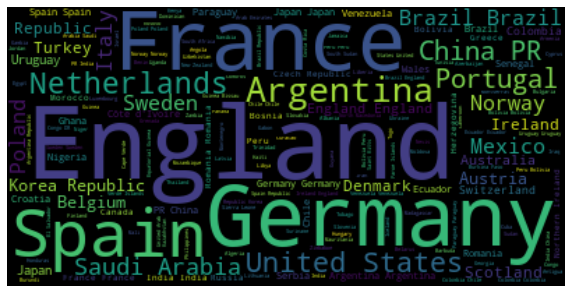

In [ ]:
# Most popular nationalities in the dataset
from wordcloud import WordCloud
nationality_name = " ".join(n for n in df['nationality_name'])
plt.figure(figsize=(10, 10)) 
wc = WordCloud().generate(nationality_name) 
plt.imshow(wc, interpolation='bilinear') 
plt.axis('off') 
plt.show()

#### Using WorldCloud, here we see that most of players in the dataset are from England, Germany, France and Spain.  


## General information about this dataset:
1. The dataset include the players data for the Career Mode from FIFA 22 
1. There are over 100 attributes
2. It has a mix of text and numerical values (60 numerical attributes and 50 text attributes)
3. The dataset shows player positions, with the role in the club and in the national team
4. The dataset shows player attributes with statistics as Attacking, Skills, Defense, Mentality, GK Skills, etc
5. The dataset shows player personal data like Nationality, Club, DateOfBirth, Wage, Salary, etc.
6. URL of the uploaded player faces, club and nation logos
7. Most of null data is from nation_flag_url
8. Most players in the dataset are from England, Germany, France and Spain

## 3.2 In-depth Data Exploration - Conditional Selection

Potential describes how much a certain player is expected to grow in their career. 

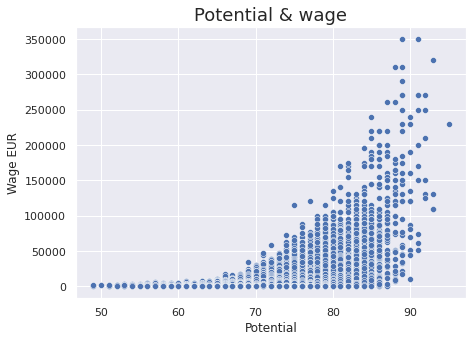

In [ ]:
# Player potential versus wages
plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['potential'], y = df['wage_eur'])
plt.xlabel("Potential") 
plt.ylabel("Wage EUR")
plt.title("Potential & wage", fontsize = 18)
plt.show()

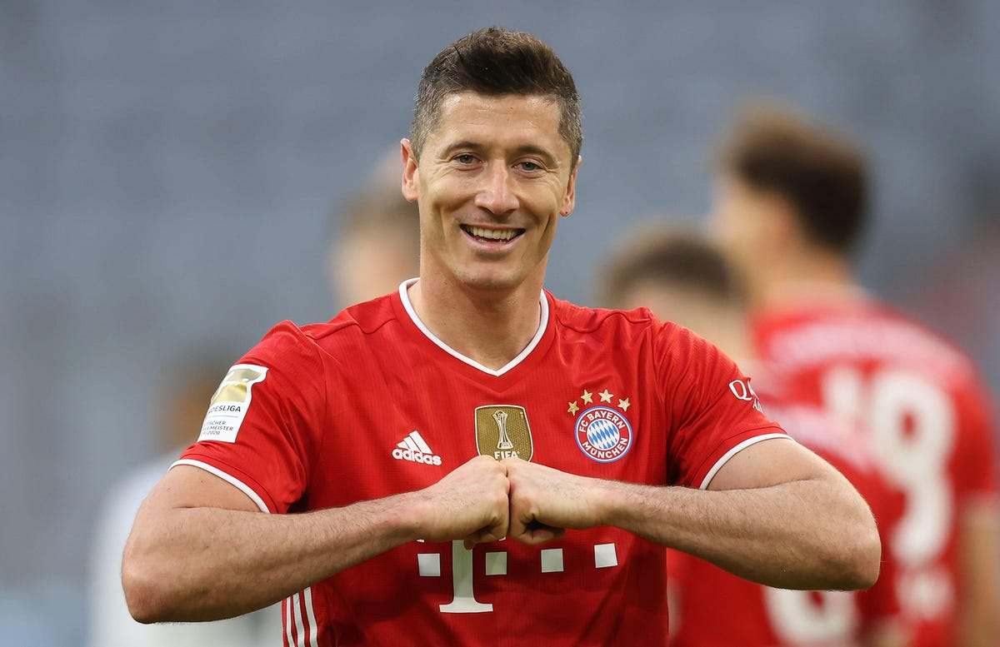

#### Here we see that, players with higher potential generally earns more wages. For example, Lionel Messi and Robert Lewandowski both has two of highest potential in this dataset, and both earn highest wages as well. 

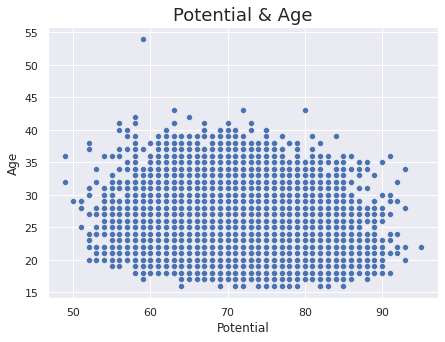

In [ ]:
# Player potential versus age

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['potential'], y = df['age'])
plt.xlabel("Potential") 
plt.ylabel("Age")
plt.title("Potential & Age", fontsize = 18)
plt.show()

Here, we don't see a clear correlation between potential and age. This possibly means that players age is not a factor in determining that player's potential. It is possible that younger players are generally healthier and has better physical attributes than older players. But older players have experience, game intelligence and techniques to overcome physical disadvantage to younger players. 

The game of soccer is a complex game that requires both physical fitness and skills, so regardless of age, most players continue to play at high level. 

In [ ]:
# Here are the 10 oldest players. The outlier above is K. Miura from Japan at 54 years old. He is the oldest player in the dataset. 

oldest_players = df[[ 'short_name', 
                      'nationality_name',
                      'age',
                      'potential',
                  ]].nlargest(10,['age']).set_index('short_name')
oldest_players

,nationality_name,age,potential
short_name,,,
K. Miura,Japan,54,59
G. Buffon,Italy,43,80
C. Lucchetti,Argentina,43,72
S. Nakamura,Japan,43,63
D. Vaca,Bolivia,42,65
K. Ellison,England,42,58
S. Torrico,Argentina,41,73
A. Boruc,Poland,41,70
P. Da Silva,Paraguay,41,67


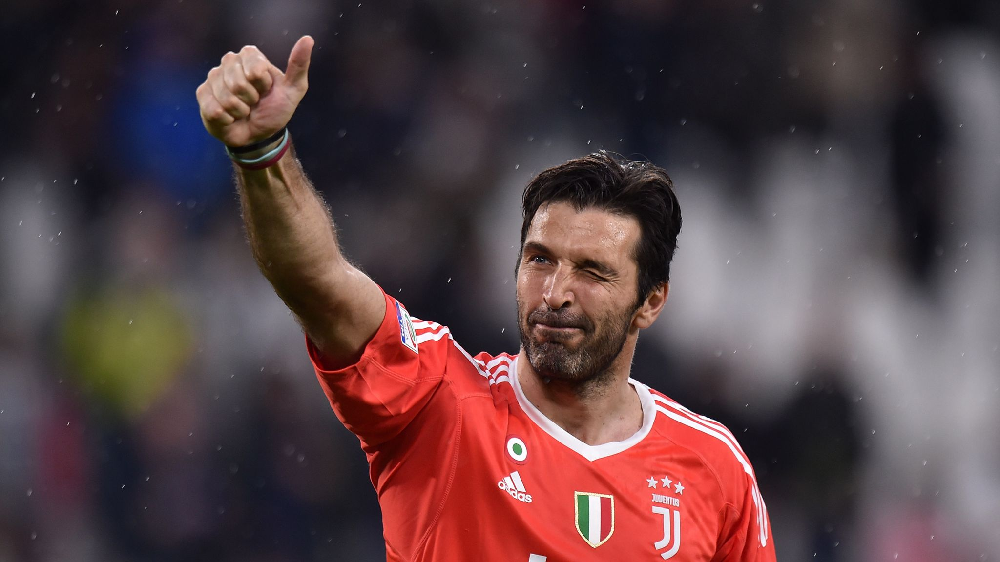

Here we see players who are oldest in the dataset. We see taht K. Miura is the oldest player at age 54, while G. Buffon is the second oldest player at age 43. We see that Gianluigi Buffon continues to play at high level even at older age compared to other older players. 

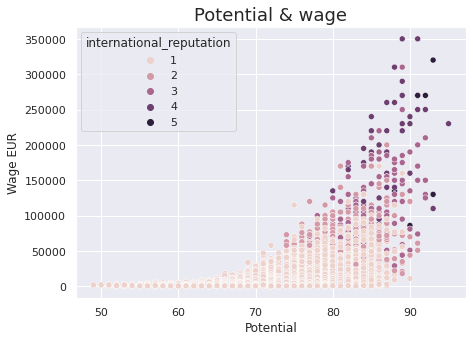

In [ ]:
# Player potential versus wages, filtered by International reputation

plt.figure(figsize=(7, 5))
ax = sns.scatterplot(x =df['potential'], y = df['wage_eur'], hue = df['international_reputation'])
plt.xlabel("Potential") 
plt.ylabel("Wage EUR")
plt.title("Potential & wage", fontsize = 18)
plt.show()

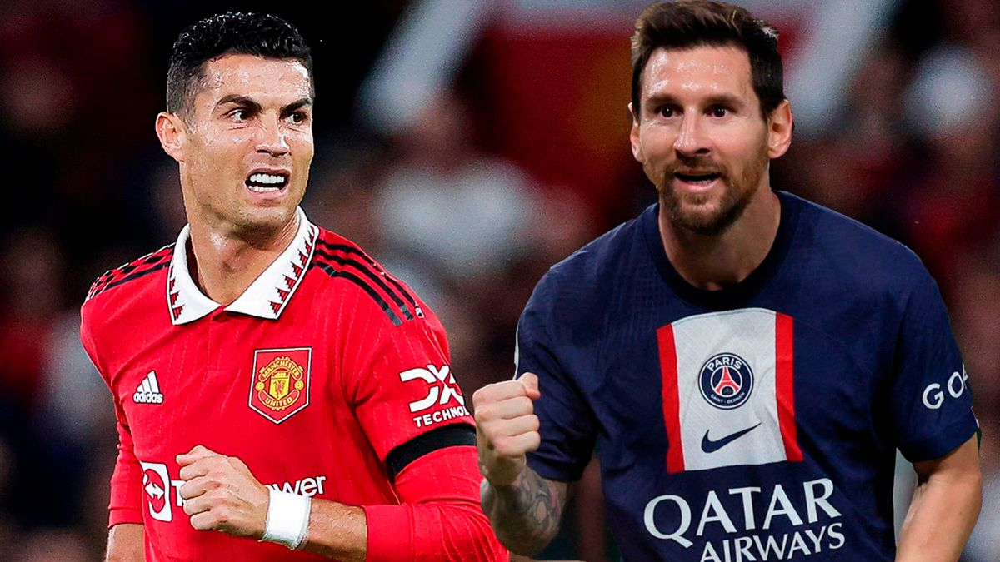

This chart is similar to the one that shows correlation between Potential and Wage, but we added a third factor called International Reputation. We see that players with highest potential earns high wages, but also has high international reputation. 

For example, players like Christiano Ronaldo and Lionel Messi would fit this category of players with high_potential/high_wage/high_reputation. 

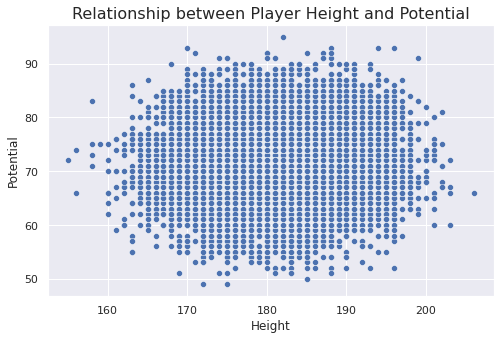

In [ ]:
# Player height versus potential
fig, ax = plt.subplots(figsize = (8,5))
ax = sns.scatterplot(x =df['height_cm'], y = df['potential'])
plt.xlabel("Height") 
plt.ylabel("Potential")
plt.title("Relationship between Player Height and Potential", fontsize = 16)
plt.show()

Here, we see the chart showing the correlation between player's height and their potential. We don't see a clear correlation between two attributes, as the game of soccer can be played by players of all heights. 

## 3.3  Pandas Profiling Feature Analysis

In [ ]:
# List all features in dataset
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name',
       'player_positions', 'overall', 'potential', 'value_eur', 'wage_eur',
       'age',
       ...
       'lcb', 'cb', 'rcb', 'rb', 'gk', 'player_face_url', 'club_logo_url',
       'club_flag_url', 'nation_logo_url', 'nation_flag_url'],
      dtype='object', length=110)

There are over 100 attributes in this dataset. Obviously, training an algorithm would be cumbersome, takes long time and wouldn't produce clear interpretation of our dataset. 

This is why we need to narrow down to a small number of features that we are interested in to build an accurate Machine Learning Model. We will be using Pandas Profiling to get a better picture of the features.

In this section, our data analysis is on the entire dataset, but in **'Model Analysis'** section, we have narrowed down to Goalkeeper position and a small number of attributes. 

In [ ]:
# Pick out the features of interest

df_subset = df[['short_name', 'player_positions', 'overall', 'potential', 'wage_eur', 'age', 'club_name', 'nationality_name', 'skill_moves', 'work_rate', 'shooting', 'passing', 'defending']]

type(df_subset)

pandas.core.frame.DataFrame

In [ ]:
df_subset.describe()

,overall,potential,wage_eur,age,skill_moves,shooting,passing,defending
count,19239.000000,19239.000000,19178.000000,19239.000000,19239.000000,17107.000000,17107.000000,17107.000000
mean,65.772182,71.079370,9017.989363,25.210822,2.352461,52.345297,57.312562,51.703630
std,6.880232,6.086213,19470.176724,4.748235,0.767659,14.051623,10.068965,16.189746
min,47.000000,49.000000,500.000000,16.000000,1.000000,18.000000,25.000000,14.000000
25%,61.000000,67.000000,1000.000000,21.000000,2.000000,42.000000,51.000000,37.000000
50%,66.000000,71.000000,3000.000000,25.000000,2.000000,54.000000,58.000000,56.000000
75%,70.000000,75.000000,8000.000000,29.000000,3.000000,63.000000,64.000000,64.000000
max,93.000000,95.000000,350000.000000,54.000000,5.000000,94.000000,93.000000,91.000000


In [ ]:
from pandas_profiling import ProfileReport

df_Subset_random = pd.DataFrame(np.random.rand(10, 5), columns = ['a', 'b', 'c', 'd', 'e'])

profile = ProfileReport(df_subset, title = 'FIFA Profiling Report', html = {'style': {'full_width': True}})

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Feature Analysis

* **Name:** 94% of names are distinct, J.Rodriguez is most common name
* **Player Position:**  Corner Back (CB) and Goal Keeper (GK) are two highest number of positions
* **Overall:** Highest overall rating in the dataset is 93, and lowest is 47
* **Potential:**  Highest potential in the dataset is 95, and lowest is 49
* **Wage:** Average wage in the dataset is 9017 EUR, while highest is 350000 EUR and lowest is 500 EUR
* **Age:**  Oldest player in the dataset is 54, and the yongest player is 16
* **Club Name:** The clubs with most number of players in the dataset are PSG, Arsenal and Brentford. 
* **Nationality:**  Most players are from England, Germany, and Spain
* **Shooting:**  Average shooting score is 52, while maximum score is 94 and minimum score is 18
* **Passing:** Average passing score is 57, while maximum score is 93 and minimum score is 25
* **Defending:**  Average shooting score is 51.7, while maximum score is 91 and minimum score is 14


Feature Correlation Analysis
* **High positive correlation between Wage and Overall score (eg. players like Lewandowski and Messi)** 
* **High positive correlation between Shooting and Passing**
* **High negative correlation between shooting and defending (eg. Strikers are not good defenders)**
* **Low correlation between Wage and Age (eg. yonger players can get paid just as much as older players if they are good. Earling Holland of Manchester City FC is only 22 year old and is currently the highest wage earner in EPL)**
* **High positive correlation between Passing and Overall Score (eg. good passing skill is one of most important attribute in soccer, as it is a team sport)**

# 4. Goalkeeper Dataset Analysis

#### For our model analysis, for simplicity and clarity, we decided to use only **goalkeeper (GK)** dataset. This allows us to:
 

*   Control attribute weight distribution (eg. Making sure no one weight overweights other weights by a lot)
*   Improve Silhoutte score (score that measures distance matrix between datapoint in a cluster)
*   Easier web app deployment (narrow down attributes from 110)


In [ ]:
df_gk=df[df.player_positions == "GK"]
df_gk.shape

(2132, 110)

In [ ]:
df_gk.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
5,200389,https://sofifa.com/player/200389/jan-oblak/220002,J. Oblak,Jan Oblak,GK,91,93,112000000.0,130000.0,28,1993-01-07,188,87,240.0,Atlético de Madrid,Spain Primera Division,1.0,GK,13.0,NaN,2014-07-16,2023.0,44,Slovenia,NaN,NaN,NaN,Right,3,1,5,Medium/Medium,Unique,Yes,238000000.0,NaN,"GK Long Throw, Comes For Crosses",NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,90,50.0,33+3,33+3,33+3,32,35,35,35,32,38+3,38+3,38+3,35+3,38+3,38+3,38+3,35+3,32+3,36+3,36+3,36+3,32+3,32+3,33+3,33+3,33+3,32+3,89+3,https://cdn.sofifa.net/players/200/389/22_120.png,https://cdn.sofifa.net/teams/240/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/si.png
7,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Peter Neuer,GK,90,90,13500000.0,86000.0,35,1986-03-27,193,93,21.0,FC Bayern München,German 1. Bundesliga,1.0,GK,1.0,NaN,2011-07-01,2023.0,21,Germany,1337.0,GK,1.0,Right,4,1,5,Medium/Medium,Unique,Yes,22300000.0,NaN,"Leadership, GK Long Throw, Rushes Out Of Goal,...",NaN,NaN,NaN,NaN,NaN,NaN,15,13,25,60,11,30,14,11,68,46,54,60,51,87,35,68,77,43,80,16,29,30,12,70,47,70,17,10,11,88,88,91,89,88,56.0,40+3,40+3,40+3,40,43,43,43,40,47+3,47+3,47+3,44+3,50+3,50+3,50+3,44+3,37+3,43+3,43+3,43+3,37+3,35+3,34+3,34+3,34+3,35+3,88+2,https://cdn.sofifa.net/players/167/495/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1337/60.png,https://cdn.sofifa.net/flags/de.png
8,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,GK,90,92,99000000.0,250000.0,29,1992-04-30,187,85,241.0,FC Barcelona,Spain Primera Division,1.0,GK,1.0,NaN,2014-07-01,2025.0,21,Germany,NaN,NaN,NaN,Right,4,1,4,Medium/Medium,Unique,Yes,210400000.0,NaN,"Rushes Out Of Goal, Comes For Crosses, Saves w...",NaN,NaN,NaN,NaN,NaN,NaN,18,14,11,61,14,21,18,12,63,30,38,50,39,86,43,66,79,35,78,10,43,22,11,70,25,70,25,13,10,88,85,88,88,90,43.0,35+3,35+3,35+3,35,38,38,38,35,42+3,42+3,42+3,39+3,45+3,45+3,45+3,39+3,33+3,41+3,41+3,41+3,33+3,31+3,33+3,33+3,33+3,31+3,88+3,https://cdn.sofifa.net/players/192/448/22_120.png,https://cdn.sofifa.net/teams/241/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/de.png
12,192119,https://sofifa.com/player/192119/thibaut-court...,T. Courtois,Thibaut Courtois,GK,89,91,85500000.0,250000.0,29,1992-05-11,199,96,243.0,Real Madrid CF,Spain Primera Division,1.0,GK,1.0,NaN,2018-08-09,2026.0,7,Belgium,1325.0,GK,1.0,Left,3,1,4,Medium/Medium,Unique,Yes,181700000.0,NaN,"

In [ ]:
df_gk = df_gk.rename(columns={'short_name': 'name','goalkeeping_diving':'diving','goalkeeping_handling':'handling','goalkeeping_kicking':'kicking','goalkeeping_positioning':'positioning','goalkeeping_reflexes':'reflexes','goalkeeping_speed':'speed'})

In [ ]:
attributes= ['name','overall','age','wage_eur','value_eur','diving', 'handling','kicking','positioning','reflexes','speed']

#### We handpicked attributes that gives us a high Silhouette score. The process of choosing the attribute was done through trial-and-error, as we experimented with different combination of attributes to obtain high Silhouette score, as well avoid overweight to any one attribute that will vastly influence the model's performance. 

### Attributes we used for our models are as follows:

*   Name
*   Overall (score)
*   Age
*   Wage (in Euros)
*   Value (in Euros)
*   Diving
*   Handling
*   Kicking
*   Positioning
*   Reflexes
*   Speed




In [ ]:
df_gk_final = df_gk[attributes].copy()
df_gk.reset_index(drop=True, inplace=True)
df_gk.head()

,name,overall,age,wage_eur,value_eur,diving,handling,kicking,positioning,reflexes,speed
0,J. Oblak,91,28,130000.0,112000000.0,87,92,78,90,90,50.0
1,M. Neuer,90,35,86000.0,13500000.0,88,88,91,89,88,56.0
2,M. ter Stegen,90,29,250000.0,99000000.0,88,85,88,88,90,43.0
3,T. Courtois,89,29,250000.0,85500000.0,84,89,74,86,88,46.0
4,Ederson,89,27,200000.0,94000000.0,87,82,93,88,88,64.0


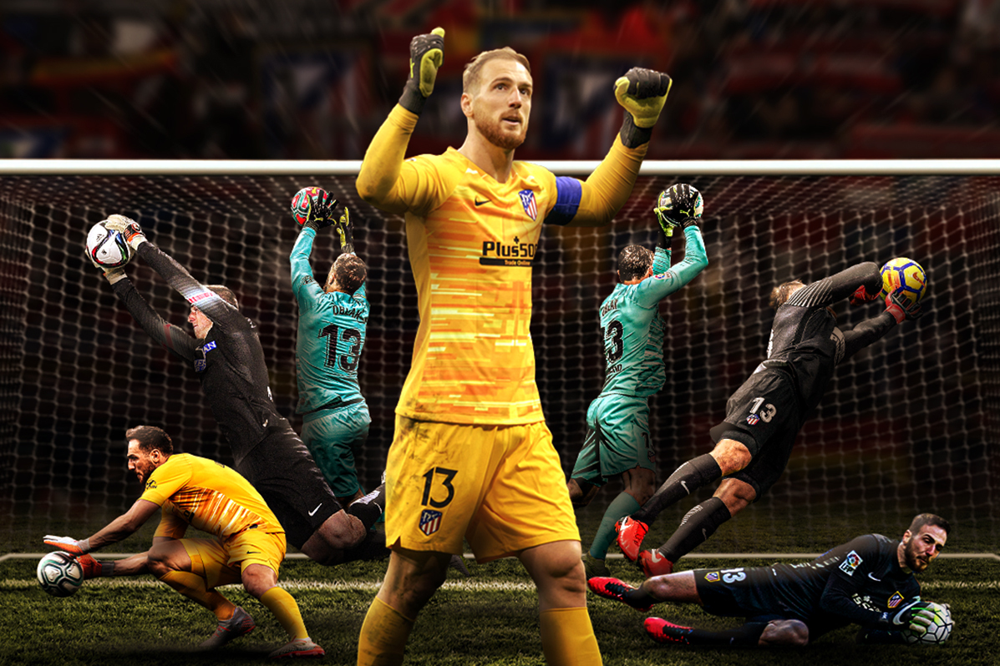

### Fun fact: The goalkeeper with the highest overall rating in the FIFA22 dataset is Jan Oblak, who plays for Atlético Madrid.

In [ ]:
df_gk_final.shape

(2132, 11)

### Finally, our model will use Goalkeeper dataset that has 2124 distinct players and 11 attributes.

In [ ]:
profile_gk = ProfileReport(df_gk_final, title = 'Goalkeepers Profile Report', html = {'style': {'full_width': True}})

In [ ]:
profile_gk

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*Feature Analysis*

* **Name:** 99% of names are distinct
* **Overall:** Highest overall rating in the dataset is 91, and lowest is 47, with the mean rating of 64
* **Age:**  Oldest goalkeeper in the dataset is 43, and youngest is 16. Average age of goalkeeper is 26
* **Wage:** Average wage in the dataset is 6349 EUR, while highest is 250000 EUR and lowest is 500 EUR
* **Value:** Average value of goalkeeper in the dataset is 1,930,764 EUR, while highest is 119,500,000 EUR and lowest is 9,000 EUR
* **Diving:**  Average diving score is 65, while maximum score is 91 and minimum score is 41
* **Handling:** Average Handling score is 63, while maximum score is 92 and minimum score is 41
* **Kicking:**  Average Kicking score is 62, while maximum score is 93 and minimum score is 39
* **Positioning:**  Average Positioning score is 63, while maximum score is 92 and minimum score is 38
* **Reflexes:** Average Reflexes score is 66, while maximum score is 90 and minimum score is 35
* **Speed:**  Average Speed score is 36, while maximum score is 65 and minimum score is 15


*Feature Correlation Analysis*
* **High positive correlation between Diving and Overall score:**  Often, goalkeeper must dive from their stationary position to block the shot from the shooter. The goalkeeper that can dive better has higher chance of blocking the shot, therefore, gets higher score
* **High positive correlation between Diving and Reflexes:** The goalkeeper must make a decision instantly before they dive left or dive right to block the shot. The goalkeeper with faster reflexes with therefore, dive better. 
* **No correlation between Age and Value:** Soccer player's value comes from their performance in games, and goalkeepers at age that plays well in games will earn high valuation. 
* **High correlation between Handling and Positioning:** Goalkeepers that handles balls well are usually better positioned to receive the ball. 

# 5. Model Analysis
Professional Soccer clubs has to invest a lot of resources, time and money in the recruitment of best players available. The use of clustering on the database of football players based on their performance data is useful for prototyping potentially successful players, and also for providing insights to football managers and scouts when assessing players.

The clustering model techniques allows us to use different types of variables (strings, numerical, categorial) and different types of attributes to be taken into account. The weight is objectively assigned to the distance matrix associated to each set of attributes during the optimization process (D’Urso, 2022). 

The weights show how relevant each attribute type is in the clustering output. The benefit of clustering is that it is robust against outliers. The obtained weights allow to understand which is the most relevant set of attributes in partitiong the players into clustering groups (D’Urso, 2022). 

In [ ]:
from pycaret.clustering import *

exp_clu101 = setup(data=df_gk_final, transformation=True, normalize = True, normalize_method = 'robust', ignore_features = ['name'],session_id = 123)

* We first setup the Pycaret cluster models environment 
* In the steup, we will normalize the data using yeo-johson transformation and then scale it using Robust Scaler Technique
* The above steps have been underataken to reduce the impact of outliers present in "wages_eur" and "value_eur" variables.

In [ ]:
models()

INFO:logs:gpu_param set to False


,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


* The different clustering algorithms available in Pycaret is as shown above
* We will explore K-Means, DBSCAN and K-Modes, before finalizing the best model amongst them

In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2277,1331.0122,1.4033,0,0,0


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
kmodes = create_model('kmodes')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.1228,33.2312,11.5088,0,0,0


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:KModes(cat_dissim=<function matching_dissim at 0x7f4f4d501b90>, init='Cao',
       max_iter=100, n_clusters=4, n_init=1, n_jobs=-1, random_state=123,
       verbose=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
dbscan=create_model('dbscan')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,-0.2708,0.4448,3.4137,0,0,0


INFO:logs:create_model_container: 4
INFO:logs:master_model_container: 4
INFO:logs:display_container: 5
INFO:logs:DBSCAN(algorithm='auto', eps=0.5, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=-1, p=None)
INFO:logs:create_model() succesfully completed......................................


* After exploring different models, we can conclude that K-means technique is best suited for this dataset

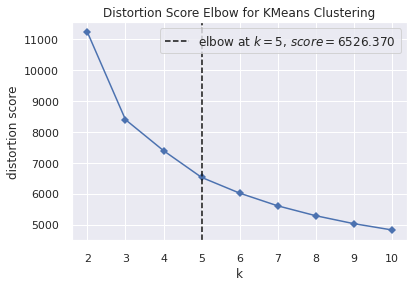

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot='elbow')

#Elbow method: 
In this method, we will change the number of clusters (K) between 1 and 10, and for each value of K, we will calculate the Within-Cluster Sum of Square (WCSS). The WCSS is the sum of squared distance between each point and the centroid in a cluster. When we we plot the WCSS with a paticluar K value, the plot looks like an Elbow. As the number of clusters increases, the WCSS value will start to decrease. So, WCSS value is largest when K = 1, and the plot will rapidly change at a point and thus creating an elbow shape. From this point, the graph starts to move almost parallel to the X-axis. The K value corresponding to this point is the optimal K value or an optimal number of clusters.

* For our dataset, K = 5, which means beyond 5 clusters, the efficiency of the model will not increase. 
  

In [ ]:
kmeans5 = create_model('kmeans', num_clusters=5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2308,1199.5065,1.3362,0,0,0


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)
INFO:logs:create_model() succesfully completed......................................




*   When we model for K=5 clusters, we get a silhoutte score of 0.2308
*   The *silhouette value* is a measure of how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette ranges from −1 to +1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. 

* Although not very high, this value seems the highest we can obtain from this dataset. 

* The model also has a Calinski-Harabasz score of 1199.5065. The Calinski-Harabasz index is the ratio of the sum of between-clusters dispersion and of inter-cluster dispersion for all clusters.The higher the score , the better the performance.

* In general, the model does show separation but lacks cohesion. 

In [ ]:
plot_model(kmeans5)

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows the five clusters after running the K-Means model

Clusters are formed based on player value

*   Cluster 2 is the cluster with all top players, followed by cluster 3, Cluster 4, Cluster 0 and Cluster 1 




In [ ]:
plot_model(kmeans5, plot = 'tsne') 

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


This is a t-distributed stochastic neighbor embedding plot which is a three-dimensional view of the clusters

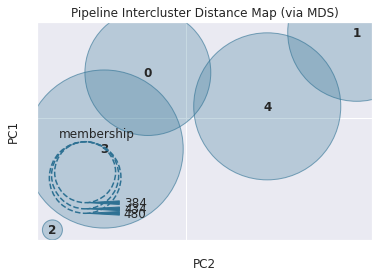

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans5, plot = 'distance') 

Intercluster distance maps show an embedding of the cluster centers in two dimensions with the distance to other centers preserved

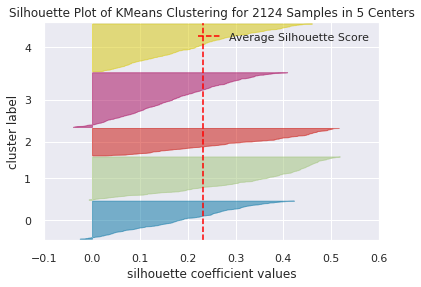

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans5, plot = 'silhouette') 

The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually

In [ ]:
plot_model(kmeans5, plot = 'distribution') #to see size of clusters

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


PLot shows the size of each cluster

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'overall')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "overall" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'age')

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "age" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'wage_eur')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "wage_eur" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'value_eur')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "value_eur" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'diving')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "diving" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'handling')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "handling" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'kicking')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "kicking" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'positioning')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "positioning" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'reflexes')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "reflexes" across clusters

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'speed')

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


Plot shows distribution of attribute "speed" across clusters

In [ ]:
kmean_results = assign_model(kmeans5)
kmean_results.head()

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Means Clustering
INFO:logs:Copying data
INFO:logs:(2132, 12)
INFO:logs:assign_model() succesfully completed......................................


,name,overall,age,wage_eur,value_eur,diving,handling,kicking,positioning,reflexes,speed,Cluster
0,J. Oblak,91,28,130000.0,112000000.0,87,92,78,90,90,50.0,Cluster 2
1,M. Neuer,90,35,86000.0,13500000.0,88,88,91,89,88,56.0,Cluster 2
2,M. ter Stegen,90,29,250000.0,99000000.0,88,85,88,88,90,43.0,Cluster 2
3,T. Courtois,89,29,250000.0,85500000.0,84,89,74,86,88,46.0,Cluster 2
4,Ederson,89,27,200000.0,94000000.0,87,82,93,88,88,64.0,Cluster 2


Gives the final output dataframe

In [ ]:
save_model(kmeans,'Final Kmeans Model CSML-Oct2022')

This is the final model which will be used for app deployment

In [ ]:
kmeans.to_json()

In [ ]:
df_kmeans = kmean_results.copy() 

In [ ]:
df_kmeans.head()

,name,overall,age,wage_eur,value_eur,diving,handling,kicking,positioning,reflexes,speed,Cluster
0,J. Oblak,91,28,130000.0,112000000.0,87,92,78,90,90,50.0,Cluster 2
1,M. Neuer,90,35,86000.0,13500000.0,88,88,91,89,88,56.0,Cluster 2
2,M. ter Stegen,90,29,250000.0,99000000.0,88,85,88,88,90,43.0,Cluster 2
3,T. Courtois,89,29,250000.0,85500000.0,84,89,74,86,88,46.0,Cluster 2
4,Ederson,89,27,200000.0,94000000.0,87,82,93,88,88,64.0,Cluster 2


In [ ]:
df_kmeans_new = df_kmeans.replace(['Cluster 0','Cluster 1','Cluster 2','Cluster 3','Cluster 4'],[0,1,2,3,4])
df_kmeans_new

,name,overall,age,wage_eur,value_eur,diving,handling,kicking,positioning,reflexes,speed,Cluster
0,J. Oblak,91,28,130000.0,112000000.0,87,92,78,90,90,50.0,2
1,M. Neuer,90,35,86000.0,13500000.0,88,88,91,89,88,56.0,2
2,M. ter Stegen,90,29,250000.0,99000000.0,88,85,88,88,90,43.0,2
3,T. Courtois,89,29,250000.0,85500000.0,84,89,74,86,88,46.0,2
4,Ederson,89,27,200000.0,94000000.0,87,82,93,88,88,64.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...
2127,Gao Xiang,48,20,800.0,60000.0,46,49,51,48,51,24.0,1
2128,H. Wiles-Richards,48,19,1000.0,110000.0,52,49,49,43,48,33.0,1
2129,D. Da Silva,47,21,500.0,90000.0,48,45,45,46,47,26.0,1
2130,A. Shaikh,47,18,500.0,110000.0,49,41,39,45,49,19.0,1


In [ ]:
import plotly.express as px
fig = px.parallel_coordinates(df_kmeans_new, color="Cluster", dimensions=['overall','age','wage_eur','value_eur','diving','handling','kicking','positioning','reflexes','speed'],
                              color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

The above plot is known as a parallel coordinate plot. Here each row in the output dataset is plotted as a line. Each attribute is represented by a point on the line. In this plot, we can see how the attributes are distributed across various clusters

# 6.  Conclusion with Outcomes & Improvements

Our goal for this assignment was by using clustering on a database of players, we are able to cluster players based on attribute scores. One application of our model would be, generating a list of top players that the soccer scouts might be interested in. 

Because our dataset has over 110 features, it would be more practical to narrow down the features to a few that we might be interested in. Through trial-and-error, we narrowed down features that would give us a fairly high Silhouette score (which ranges between -1 and 1). 

We also narrowed the soccer position down to just Goalkeepers, because we want to narrow our scope and concentrate our effort on analyzing small set of data. Based on our model, top goalkeepers in the dataset are put in Cluster 2, and lowest ranking goalkeepers are put in Cluster 1. 

We wanted our webapp to be able to take in real-time input from soccer scouts, where they would choose scores for different skill sets using sliders. However, we were faced with technical challenges and time constraint to execute such an app, so we had to scale down our original plan. Instead, after much discussion, we created an app that outputs players in different clusters using FIFA22 dataset. Unfortunately, we weren't able to implement real-time input functionality. 

Clearly, we noticed that unsupervised learning requires our own interpretation of the data, as opposed to supervised learning, which we know the labels beforehand. We had to spend some time understanding why players are put in different clusters and which attributes were outweight others. For example, **Overall score** attribute seem to affect the Silhouette score of our K-means model more than other attributes, such as age, reflexes, speed. 

Finally, we were constrainted by the shorter time to work on this assignment, as well as busy schedules of our group members. 


# 7. Bibilography
1. D’Urso, P., De Giovanni, L. & Vitale, V. A robust method for clustering football players with mixed attributes. Ann Oper Res (2022). https://doi.org/10.1007/s10479-022-04558-x
2. Soccermatics by David Sumpter https://soccermatics.readthedocs.io/en/latest/index.html
3. The Hundred Page Machine Learning Book. By Andriy Burkov
4. Parallel Coordinate Plots by Plotly https://plotly.com/python/parallel-coordinates-plot/


In [ ]:
pip install -U notebook-as-pdf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 220 kB 5.1 MB/s 
     |████████████████████████████████| 83 kB 1.5 MB/s 
     |████████████████████████████████| 140 kB 47.8 MB/s 
     |████████████████████████████████| 106 kB 54.8 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
requests 2.23.0 requires urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you have urllib3 1.26.12 which is incompatible.


In [ ]:
pyppeteer-install

NameError: ignored

In [ ]:
jupyter-nbconvert --to PDFviaHTML example.ipynb

SyntaxError: ignored